In [1]:
import osmnx as ox
G = ox.load_graphml('data/porto-bbox.graphml')

In [19]:
import pandas as pd
from shapely.geometry import LineString
import shapely.wkt

mr = pd.read_csv('data/mr.csv', sep=';', index_col=0)
mr.sort_index(inplace=True)
mr = mr.loc[mr['mgeom'] != 'LINESTRING()']
mr['mgeom'] = mr['mgeom'].apply(shapely.wkt.loads)
mr

,opath,cpath,mgeom
id,,,
1,"1095,1095,2732,2732,1093,1093,698,698,696,8687...","1095,2732,1093,698,8704,62550,8703,696,8687,17...","LINESTRING (-8.618623283770001 41.1414555366, ..."
2,"56205,56205,4790,70940,762,26201,26213,26202,5...","56205,69910,69917,69912,4790,56207,26241,70940...","LINESTRING (-8.63985895545 41.159750087, -8.64..."
5,"67262,67262,67260,5878,5880,61719,765,70690,73...","67262,67260,57887,67265,5875,5878,5880,41236,6...","LINESTRING (-8.6457599 41.1805278, -8.645788 4..."
6,"62561,58603,701,26471,55235,55235,55235,55235,...","62561,58603,58083,65094,57135,701,26471,55235,...","LINESTRING (-8.615516793139999 41.140715625, -..."
7,"993,1015,1015,3529,5139,69303,69300,40862,4086...","993,1015,3529,10723,5139,10772,69304,69303,693...","LINESTRING (-8.579496153999999 41.1459330735, ..."
...,...,...,...
994,"56938,56938,56938,56938,56938,56938,56936,5693...","56938,56936,1645,64636,1519,55259,55256,1389,1...","LINESTRING (-8.59697443774 41.1507050705, -8.5..."
995,"56205,56205,56205,56205,69908,10482,4788,68423...","56205,69911,69908,69915,56208,10482,68418,4788...","LINESTRING (-8.639824793960001 41.1597447069, ..."
998,"69300,69300,40862,40862,68548,40863,69301,6930...","69300,40862,68548,68549,40865,40863,40862,6854...","LINESTRING (-8.58610277406 41.1485589137, -8.5..."


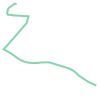

In [20]:
mr['mgeom'].iloc[0]

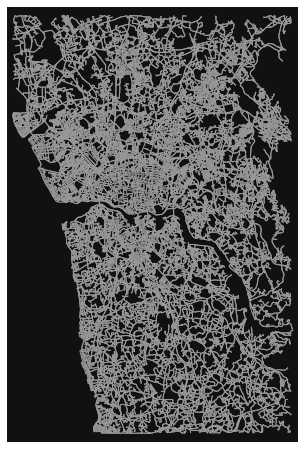

In [13]:
import osmnx as ox
G = ox.load_graphml('data/porto-bbox.graphml')
fig, ax = ox.plot_graph(G, node_size=0)

In [42]:
import numpy as np
coords = [np.array([list(i) for i in mr['mgeom'].iloc[j].coords]) for j in range(len(mr.index))]

In [47]:
import matplotlib.pyplot as plt

# Draw the basemap
fig, ax = ox.plot_graph(G, node_size=0, show=False, close=False, figsize=(48, 48))

# Get colors for each of the first 10 trajectories
color_list = ox.plot.get_colors(11, cmap='hsv', return_hex=True)[:10]

# Plot the raw GPS points on the basemap
for idx, c in enumerate(color_list):
    plt.plot(*coords[idx].T, color=c, linewidth=4)

# Save the map as an image file
fig.savefig('output/task4.png', bbox_inches='tight', pad_inches=0)
# plt.show()
plt.close(fig)